# 🧠 1. U thần kinh đệm (Glioma)

- **Vị trí:** Nằm sâu bên trong mô não, thường ở vùng trán hoặc thái dương.  
- **Đặc điểm:**  
  U có hình dạng không đều, viền mờ, phát triển xâm lấn vào các vùng lân cận, làm sưng và thay đổi cấu trúc não. Khối u lan rộng, không có ranh giới rõ ràng.  
- **Nguy cơ:**  
  Đây là loại u ác tính, phát triển nhanh, khó điều trị và dễ tái phát. Có thể ảnh hưởng nghiêm trọng đến chức năng não và tính mạng.

---

# 🧠 2. U màng não (Meningioma)

- **Vị trí:** Nằm bên ngoài mô não, dính vào lớp màng bao quanh não (màng cứng), thường sát hộp sọ.  
- **Đặc điểm:**  
  Là khối u tròn, rõ ràng, viền sắc nét, phát triển chậm và đẩy mô não xung quanh chứ không xâm nhập vào mô não.  
- **Nguy cơ:**  
  Thường là u lành tính, phát triển chậm, dễ điều trị bằng phẫu thuật. Tuy nhiên nếu khối u lớn có thể gây chèn ép não, ảnh hưởng chức năng thần kinh.

---

# 🧠 3. U tuyến yên (Pituitary tumor)

- **Vị trí:** Nằm trong **hố yên (sella turcica)** – một hốc nhỏ ở đáy sọ, nơi chứa tuyến yên.  
- **Đặc điểm:**  
  Là khối u nhỏ, tròn, nằm chính giữa vùng đáy sọ. Có thể phát triển lên trên và chèn ép vùng thị giác, ảnh hưởng tới tầm nhìn và điều hòa hormone trong cơ thể.  
- **Nguy cơ:**  
  Thường là u lành tính, nhưng nếu kích thước lớn có thể gây rối loạn thị lực và rối loạn nội tiết nghiêm trọng.



# Khai báo các thư viện cần thiết

In [39]:
!pip install -q segmentation_models

In [40]:
import sys
import importlib.util
import shutil

sys.path.append('/kaggle/input/python-code')

def import_module_from_path(name, path):
    spec = importlib.util.spec_from_file_location(name, path)
    mod = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(mod)
    return mod

In [41]:
preprocessing = import_module_from_path("preprocessing", "/kaggle/input/python-code/preprocessing.py")
utils = import_module_from_path("utils", "/kaggle/input/python-code/utils.py")
load_datasets = import_module_from_path("load_datasets", "/kaggle/input/python-code/load_datasets.py")
grad_cam = import_module_from_path("grad_cam", "/kaggle/input/python-code/grad_cam.py")

In [42]:
import os
import numpy as np
import pandas as pd
import cv2
import tensorflow as tf
from tensorflow.keras import layers, Model, Input, Sequential
from keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt
from tensorflow.keras.initializers import glorot_uniform, random_uniform

# Trực quan phần tiền xử lý với ảnh đầu vào

In [43]:
img = cv2.imread('/kaggle/input/brain-tumor-mri/brain-tumor-mri-dataset/Training/meningioma/Tr-me_0149.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

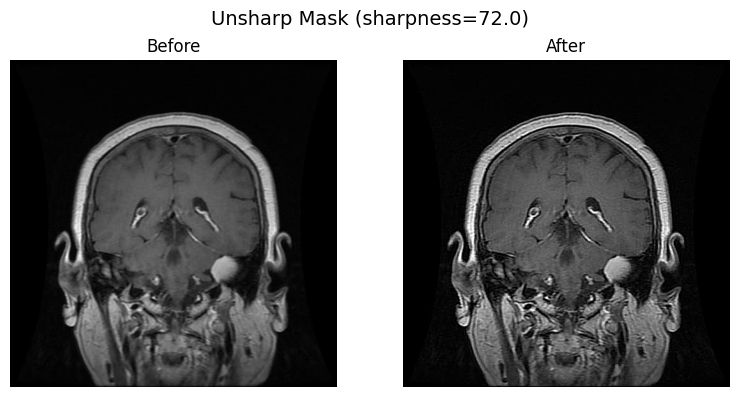

In [44]:
img = preprocessing.unsharp_mask(img, plot=True, sharpness_thresh = 80, strength=3.0)

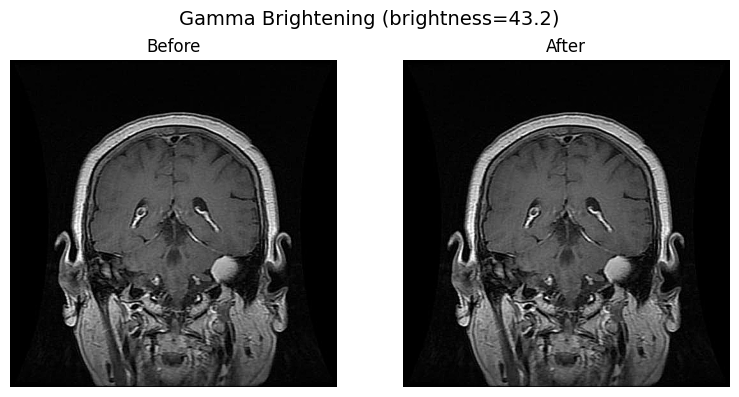

In [45]:
img = preprocessing.brighten_if_dark(img, plot=True, brightness_thresh=40)

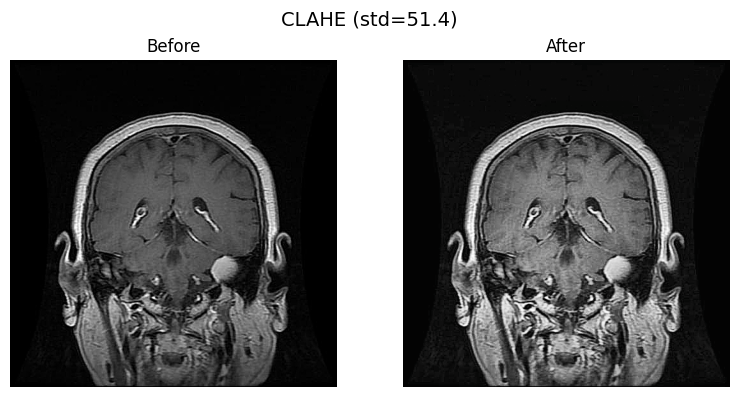

In [46]:
img = preprocessing.apply_soft_clahe(img, plot=True, std_thresh=60)

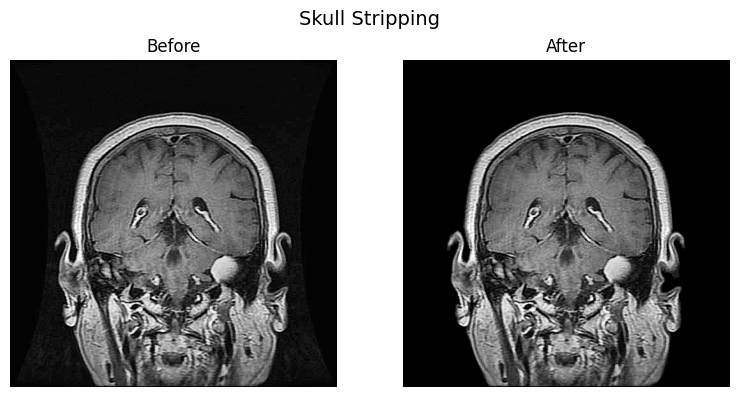

In [47]:
img = preprocessing.skull_strip(img, plot=True, thresh_blur=20)

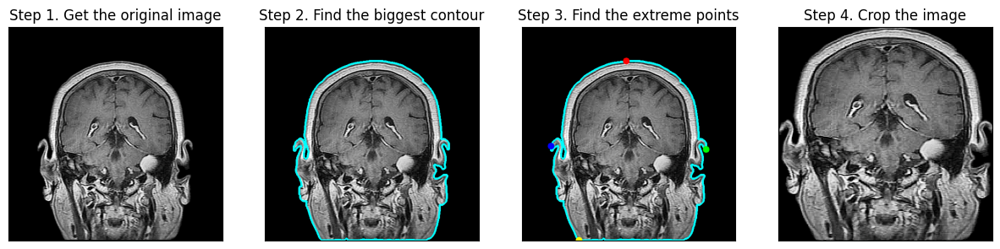

In [48]:
img = preprocessing.crop_imgs(img, plot=True, thresh_blur=20)

# Tiền xử lý trên ảnh đầu vào

In [49]:
input_dir = '/kaggle/input/brain-tumor-mri/brain-tumor-mri-dataset'
output_dir = '/kaggle/working/dataset_pre'
preprocessing.process_and_save_images_classification(input_dir, output_dir, thresh_blur=20, sharpness_thresh=80, brightness_thresh=40, std_thresh=60, strength=3.0)

Testing/glioma: 100%|██████████| 300/300 [00:05<00:00, 55.26it/s]


# Đọc vào dữ liệu sau khi đã tiền xử lý

In [50]:
train_path = os.path.join(output_dir, 'Training')
test_path = os.path.join(output_dir, 'Testing')

In [51]:
train_ds, val_ds, test_ds, class_names = load_datasets.load_datasets_classification(train_path, test_path, batch_size=32, img_size=(224, 224), validation_split=0.15)

Found 8406 files belonging to 4 classes.
Using 7146 files for training.
Found 8406 files belonging to 4 classes.
Using 1260 files for validation.
Found 1311 files belonging to 4 classes.
Class names: ['glioma', 'meningioma', 'notumor', 'pituitary']


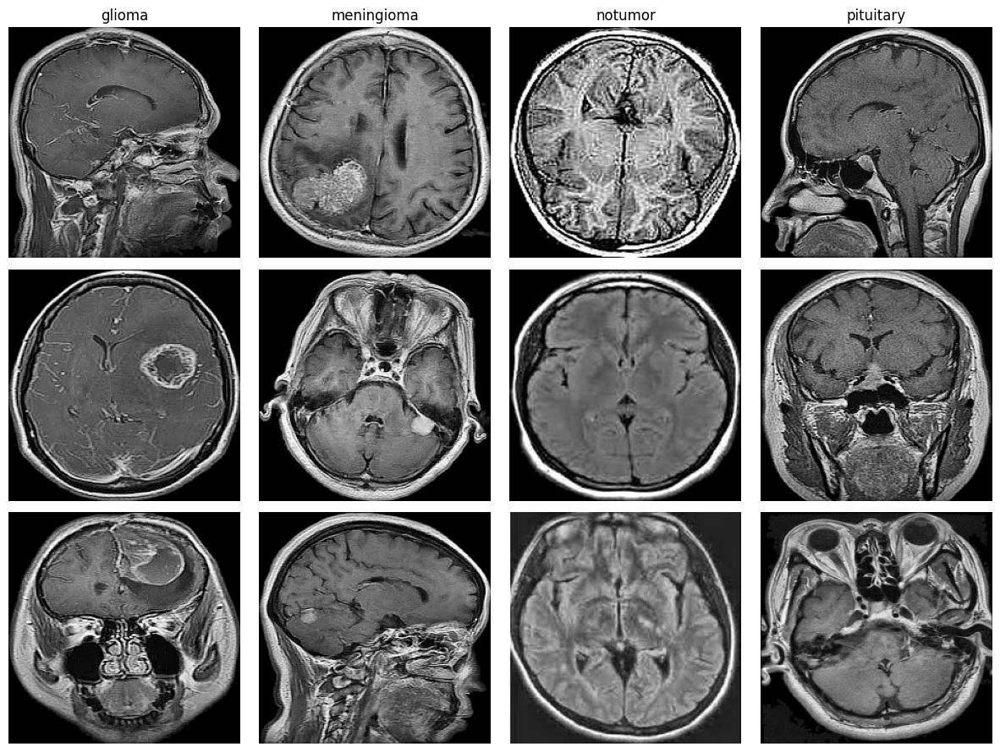

In [52]:
utils.plot_sample_images(train_ds=train_ds, class_names=class_names)

# Trực quan hóa số lượng mẫu của mỗi nhãn trên từng tập dữ liệu

In [53]:
train_class_counts = utils.count_class_distribution(train_ds, class_names)
val_class_counts = utils.count_class_distribution(val_ds, class_names)
test_class_counts = utils.count_class_distribution(test_ds, class_names)

train_df = pd.DataFrame(list(train_class_counts.items()), columns=['Class', 'Count']).sort_values('Count').reset_index(drop=True)
val_df = pd.DataFrame(list(val_class_counts.items()), columns=['Class', 'Count']).sort_values('Count').reset_index(drop=True)
test_df = pd.DataFrame(list(test_class_counts.items()), columns=['Class', 'Count']).sort_values('Count').reset_index(drop=True)

data = {
    'Set': ['Training Set', 'Validation Set', 'Testing Set'],
    'Count': [sum(train_class_counts.values()), sum(val_class_counts.values()), sum(test_class_counts.values())],
}

df = pd.DataFrame(data)
df = df.sort_values("Count")

print("\nTỷ lệ phân chia ảnh giữa các tập huấn luyện, kiểm tra và kiểm định:")
print(df)
print("\nPhân bố số lượng ảnh theo từng lớp trong tập huấn luyện:")
print(train_df)
print("\nPhân bố số lượng ảnh theo từng lớp trong tập kiểm định:")
print(val_df)
print("\nPhân bố số lượng ảnh theo từng lớp trong tập kiểm tra:")
print(test_df)


Tỷ lệ phân chia ảnh giữa các tập huấn luyện, kiểm tra và kiểm định:
              Set  Count
1  Validation Set   1260
2     Testing Set   1311
0    Training Set   7146

Phân bố số lượng ảnh theo từng lớp trong tập huấn luyện:
        Class  Count
0     notumor   1680
1      glioma   1740
2  meningioma   1827
3   pituitary   1899

Phân bố số lượng ảnh theo từng lớp trong tập kiểm định:
        Class  Count
0      glioma    287
1     notumor    304
2  meningioma    327
3   pituitary    342

Phân bố số lượng ảnh theo từng lớp trong tập kiểm tra:
        Class  Count
0      glioma    300
1   pituitary    300
2  meningioma    306
3     notumor    405


# Số lượng mẫu trên từng tập dữ liệu

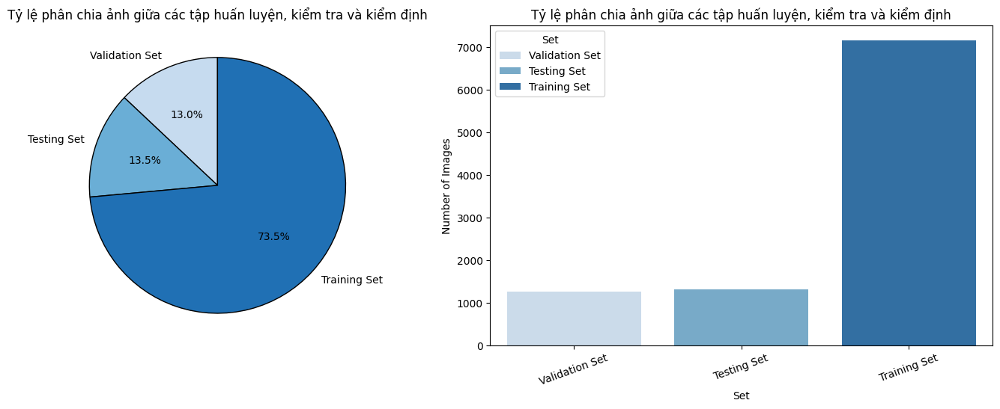

In [54]:
utils.plot_distribution(df, title="Tỷ lệ phân chia ảnh giữa các tập huấn luyện, kiểm tra và kiểm định", palette_name="Blues", x_col="Set", hue_col="Set")

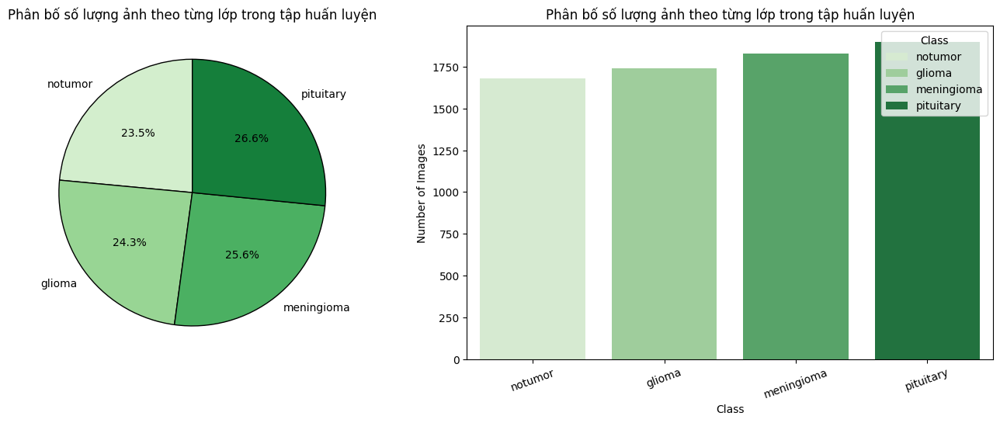

In [55]:
utils.plot_distribution(train_df, title="Phân bố số lượng ảnh theo từng lớp trong tập huấn luyện", palette_name="Greens", x_col="Class", hue_col="Class")

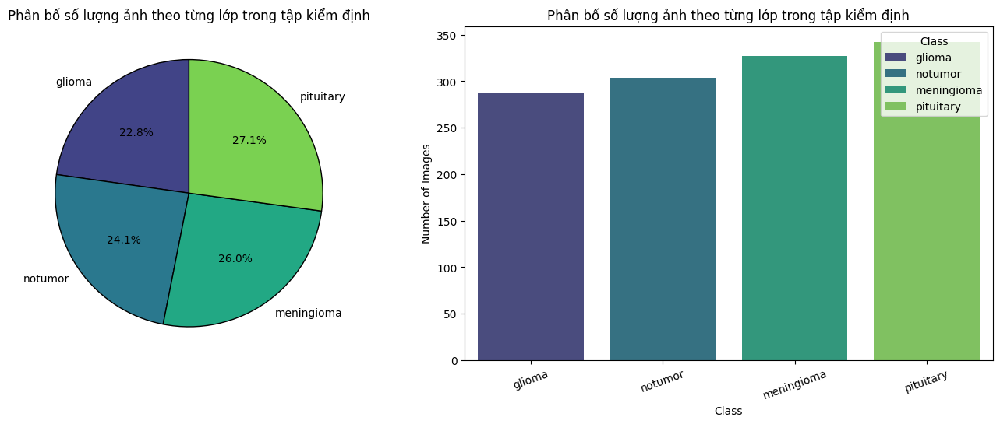

In [56]:
utils.plot_distribution(val_df, title="Phân bố số lượng ảnh theo từng lớp trong tập kiểm định", palette_name="viridis", x_col="Class", hue_col="Class")

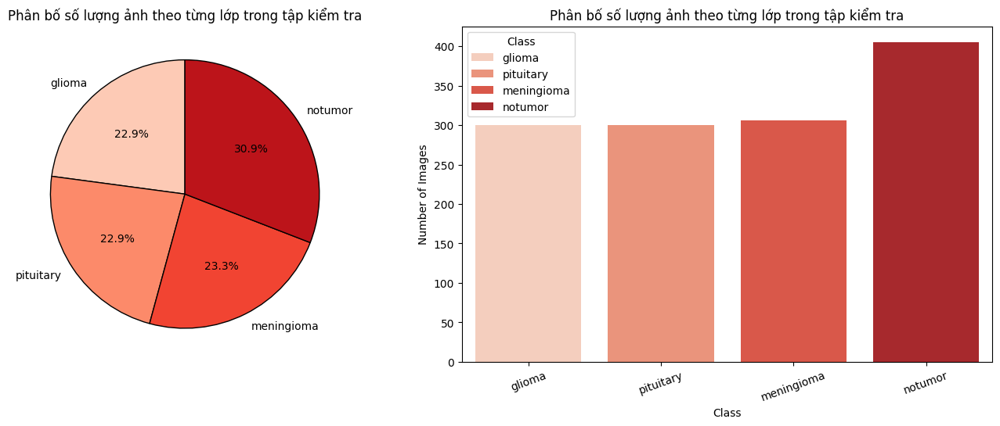

In [57]:
utils.plot_distribution(test_df, title="Phân bố số lượng ảnh theo từng lớp trong tập kiểm tra", palette_name="Reds", x_col="Class", hue_col="Class")

# Tăng cường dữ liệu trên tập huấn luyện

In [58]:
data_augmentation = Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.05, fill_mode="nearest"),
    layers.RandomZoom(0.05, fill_mode="nearest"),
])

train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)


# Trực quan dữ liệu của tập huấn luyện sau khi áp dụng kỹ thuật tăng cường dữ liệu

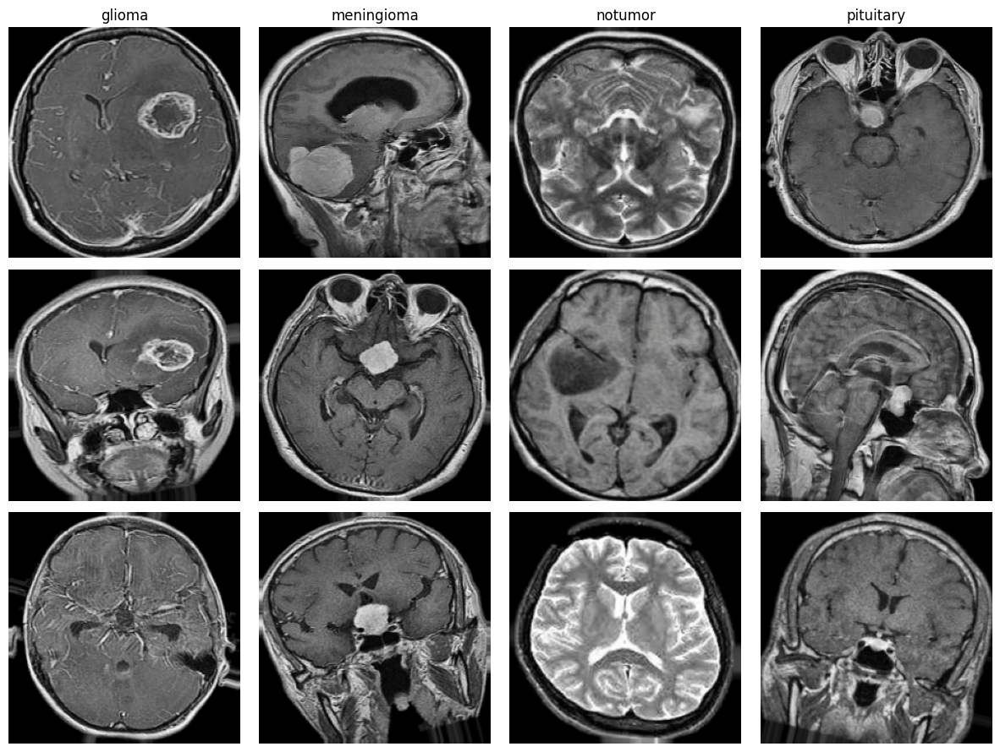

In [59]:
utils.plot_sample_images(train_ds=train_ds, class_names=class_names)

# Khai báo mô hình ResNet50 và các tham số huấn luyện mô hình

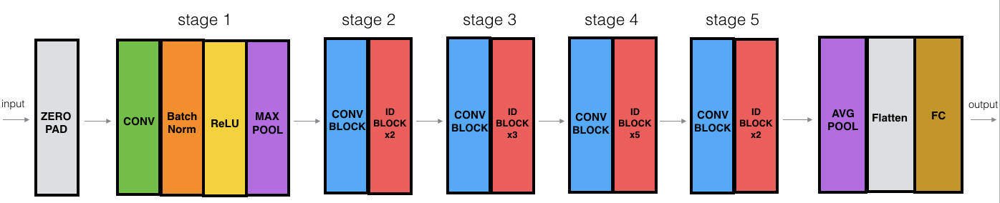

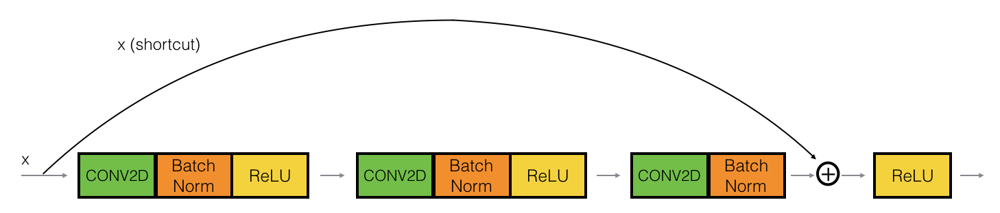

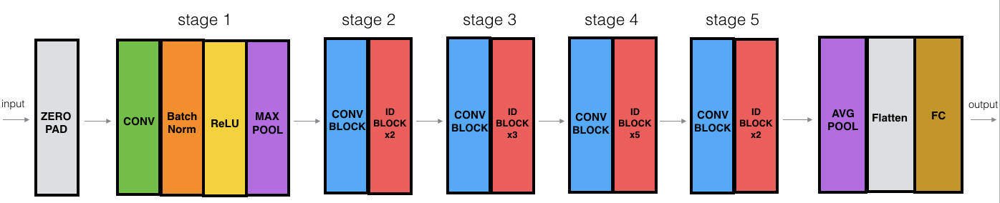

In [60]:
from IPython.display import Image, display, HTML

def show_image_with_title(title, path, width=1000):
    display(HTML(f"<h4>{title}</h4>"))
    display(Image(path, width=width))

show_image_with_title("Hình 1: Kiến trúc tổng thể ResNet50", "/kaggle/input/image-model/resnet_kiank.png")
show_image_with_title("Hình 2: Identity Block trong ResNet", "/kaggle/input/image-model/idblock3_kiank.png")
show_image_with_title("Hình 3: Convolutional Block trong ResNet", "/kaggle/input/image-model/resnet_kiank.png")


In [61]:
base_model = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

for layer in base_model.layers[-25:]:
    layer.trainable = True

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(4, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=outputs)

In [62]:
model.summary()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,851,012 (90.98 MB)

 Trainable params: 23,797,636 (90.78 MB)

 Non-trainable params: 53,376 (208.50 KB)

In [63]:
optimizer = tf.keras.optimizers.Adamax(learning_rate = 0.0001)

model.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=10,
    restore_best_weights=True,
    mode='max',
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    filepath='/kaggle/working/best_model_resnet50.keras',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=0
)

lr_schedule = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=0.00001
)

# Huấn luyện mô hình

In [64]:
history = model.fit(
    train_ds,
    epochs=40,
    validation_data=val_ds,
    callbacks=[model_checkpoint, early_stopping, lr_schedule],
    verbose=1
)

Epoch 1/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 148s 440ms/step - accuracy: 0.7670 - loss: 0.6109 - val_accuracy: 0.8135 - val_loss: 0.4310 - learning_rate: 1.0000e-04
Epoch 2/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 72s 319ms/step - accuracy: 0.9502 - loss: 0.1625 - val_accuracy: 0.9381 - val_loss: 0.2038 - learning_rate: 1.0000e-04
Epoch 3/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 72s 319ms/step - accuracy: 0.9652 - loss: 0.1014 - val_accuracy: 0.9722 - val_loss: 0.0894 - learning_rate: 1.0000e-04
Epoch 4/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 70s 312ms/step - accuracy: 0.9846 - loss: 0.0611 - val_accuracy: 0.9651 - val_loss: 0.1002 - learning_rate: 1.0000e-04
Epoch 5/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 71s 318ms/step - accuracy: 0.9919 - loss: 0.0397 - val_accuracy: 0.9857 - val_loss: 0.0552 - learning_rate: 1.0000e-04
Epoch 6/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 71s 315ms/step - accuracy: 0.9917 - loss: 0.0356 - val_accuracy: 0.9833 - val_loss: 0.0541 - learning_rate: 1.0000e-04
Epoch 7/40
224/224 ━━━━━━━━━━━━━━━━━━━━ 72s 3

# Trực quan một số độ đo đánh giá mô hình trong quá trình huấn luyện

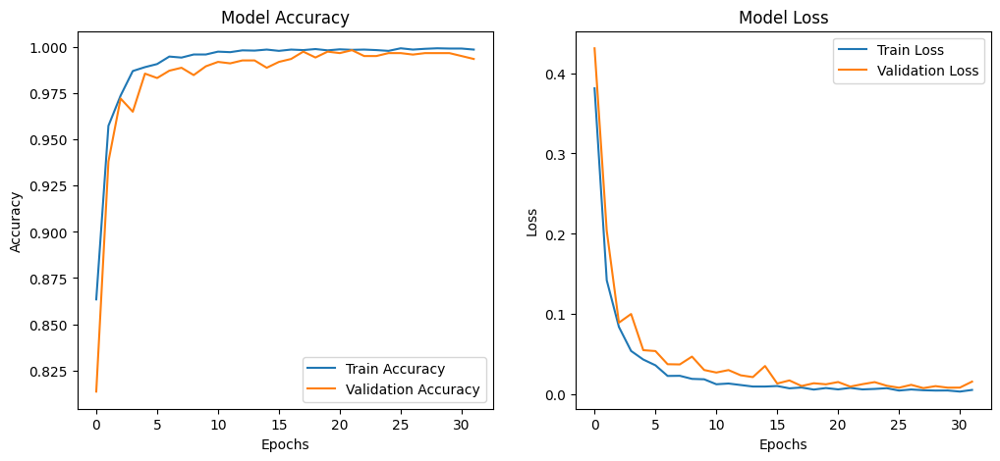

In [65]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss')

plt.show()

# Load lên model check_point để dự đoán cho tập kiểm tra

In [66]:
checkpoint_path = "/kaggle/working/best_model_resnet50.keras"
model.load_weights(checkpoint_path)

# Trực quan một số dự đoán của mô hình trên tập kiểm tra

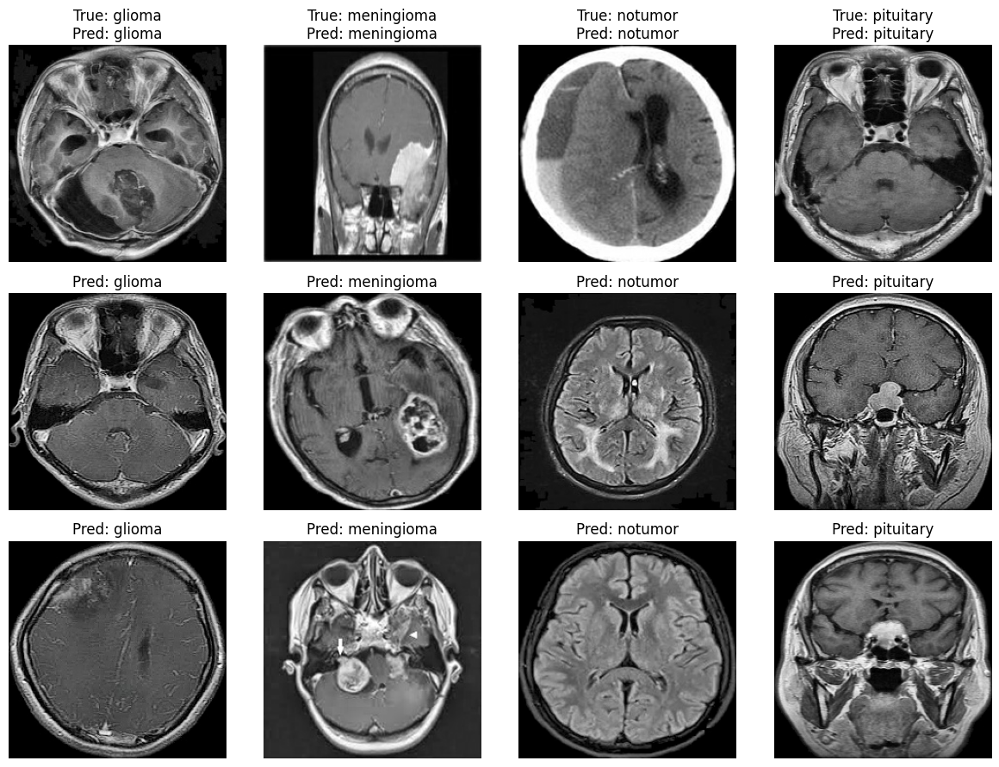

In [67]:
utils.plot_predicted_images(model=model, test_ds=test_ds, class_names=class_names)

# In ra một số độ đo đánh giá mô hình trên tập kiểm tra

In [68]:
y_true = tf.concat([y for _, y in test_ds], axis=0)
y_true = np.argmax(y_true, axis=1)
y_pred_probs = model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)

test_accuracy = accuracy_score(y_true, y_pred)
report = classification_report(y_true, y_pred, digits=4, target_names=class_names, output_dict=True)

precision = report["weighted avg"]["precision"]
recall = report["weighted avg"]["recall"]
f1_score = report["weighted avg"]["f1-score"]

beta = 2
f2_score = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall) if (precision + recall) > 0 else 0

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"F2 Score (Beta=2): {f2_score:.4f}")

41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step
Test Accuracy: 0.9947
Precision: 0.9947
Recall: 0.9947
F1 Score: 0.9947
F2 Score (Beta=2): 0.9947


# Trực quan ma trận nhầm lẫn đánh giá trên tập kiểm tra

<Figure size 1000x800 with 0 Axes>

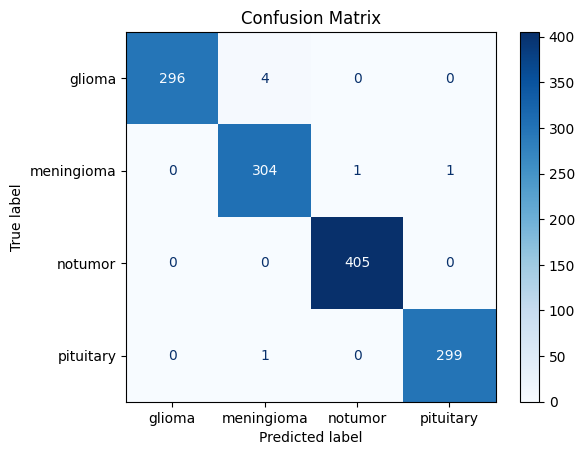

In [69]:
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format="d")
plt.title("Confusion Matrix")
plt.show()

# Trực quan các độ đo đánh giá mô hình cho từng nhãn của dữ liệu trên tập kiểm tra

In [70]:
class_metrics = {}
for class_name in class_names:
    class_metrics[class_name] = {
        "precision": report[class_name]["precision"],
        "recall": report[class_name]["recall"],
        "f1_score": report[class_name]["f1-score"],
        "accuracy": report[class_name]["accuracy"] if "accuracy" in report[class_name] else None
    }


for class_name, metrics in class_metrics.items():
    print(f"\nClass: {class_name}")
    print(f"Precision: {metrics['precision']:.4f}")
    print(f"Recall: {metrics['recall']:.4f}")
    print(f"F1 Score: {metrics['f1_score']:.4f}")
    if metrics['accuracy'] is not None:
        print(f"Accuracy: {metrics['accuracy']:.4f}")


Class: glioma
Precision: 1.0000
Recall: 0.9867
F1 Score: 0.9933

Class: meningioma
Precision: 0.9838
Recall: 0.9935
F1 Score: 0.9886

Class: notumor
Precision: 0.9975
Recall: 1.0000
F1 Score: 0.9988

Class: pituitary
Precision: 0.9967
Recall: 0.9967
F1 Score: 0.9967


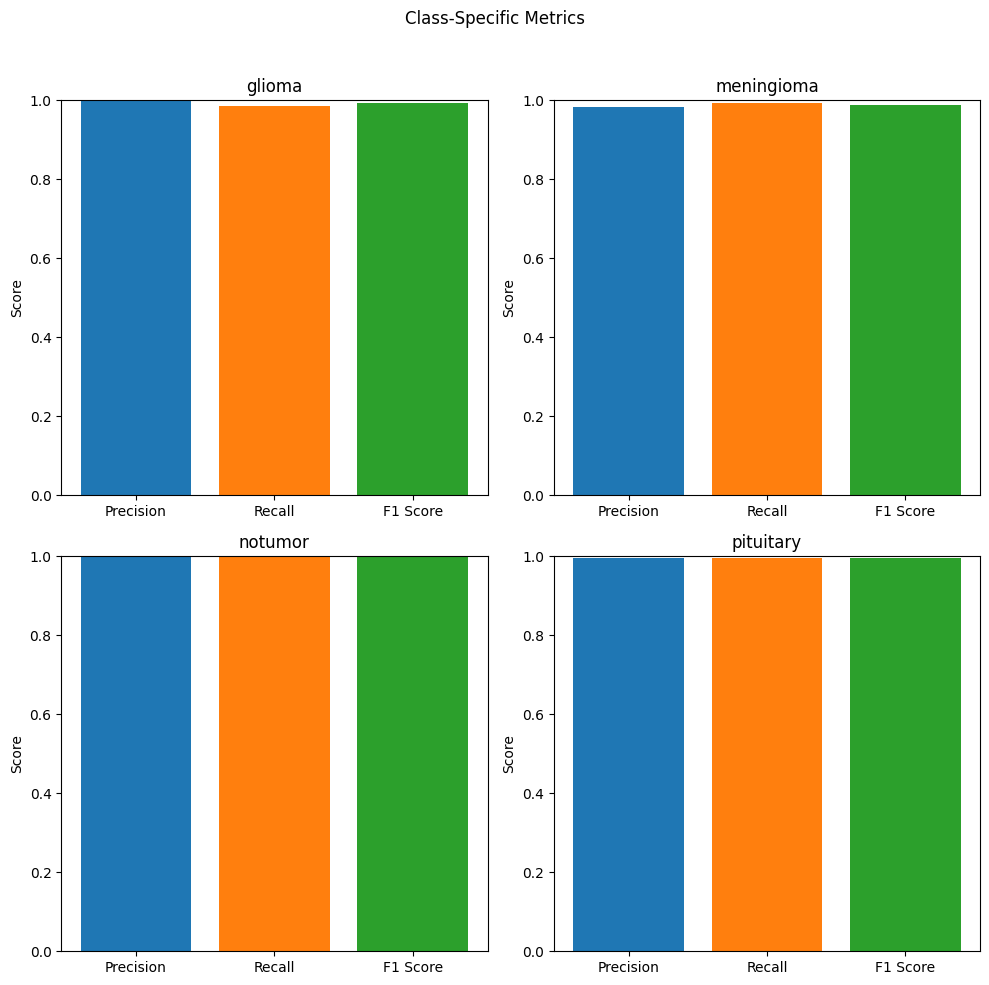

In [71]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Class-Specific Metrics')

for idx, (class_name, metrics) in enumerate(class_metrics.items()):
    row, col = divmod(idx, 2)
    ax = axs[row, col]
    metric_names = ["Precision", "Recall", "F1 Score"]
    metric_values = [metrics["precision"], metrics["recall"], metrics["f1_score"]]

    if metrics["accuracy"] is not None:
        metric_names.append("Accuracy")
        metric_values.append(metrics["accuracy"])

    ax.bar(metric_names, metric_values, color=['C0', 'C1', 'C2'])
    ax.set_ylim(0, 1)
    ax.set_title(class_name)
    ax.set_ylabel('Score')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Sử dụng kỹ thuật grad-cam để trực quan các đặc trưng quan trọng giúp mô hình dự đoán cho một số mẫu mới

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


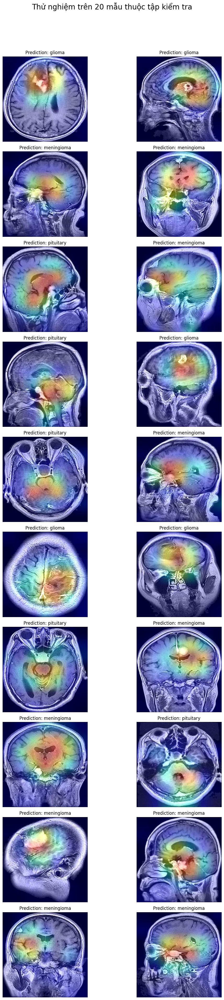

In [74]:
from PIL import Image
import glob

last_conv_layer_name = "conv5_block3_out"
path_array = glob.glob('/kaggle/input/testttt/image/*')

path_array = np.random.choice(path_array, size=20, replace=False)

n_samples = len(path_array)
n_cols = 2
n_rows = (n_samples + 1) // n_cols

fig = plt.figure(figsize=(12, n_rows * 4))
fig.suptitle(f"Thử nghiệm trên {n_samples} mẫu thuộc tập kiểm tra", fontsize=20)

for i in range(n_samples):
    ax = plt.subplot(n_rows, n_cols, i + 1)

    img = cv2.imread(path_array[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = preprocessing.unsharp_mask(img, sharpness_thresh=80, strength=3.0)
    img = preprocessing.brighten_if_dark(img, brightness_thresh=40)
    img = preprocessing.apply_soft_clahe(img, std_thresh=60)
    img = preprocessing.skull_strip(img, thresh_blur=20)
    img = preprocessing.crop_imgs(img, thresh_blur=20)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
   
    cam_path, prediction = grad_cam.make_prediction(
        img, model=model,
        cam_path=f"{i}.jpeg",
        last_conv_layer_name=last_conv_layer_name
    )
    
    test_img = Image.open(cam_path)
    plt.imshow(test_img)
    plt.title("Prediction: " + prediction, fontsize=12)
    plt.axis("off")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
